In [364]:
import networkx as nx

import matplotlib.pyplot as plt
import matplotlib as mpl

import numpy as np
import pandas as pd

In [365]:
data = pd.read_csv("2007.csv")

In [366]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7453215 entries, 0 to 7453214
Data columns (total 29 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Year               int64  
 1   Month              int64  
 2   DayofMonth         int64  
 3   DayOfWeek          int64  
 4   DepTime            float64
 5   CRSDepTime         int64  
 6   ArrTime            float64
 7   CRSArrTime         int64  
 8   UniqueCarrier      object 
 9   FlightNum          int64  
 10  TailNum            object 
 11  ActualElapsedTime  float64
 12  CRSElapsedTime     float64
 13  AirTime            float64
 14  ArrDelay           float64
 15  DepDelay           float64
 16  Origin             object 
 17  Dest               object 
 18  Distance           int64  
 19  TaxiIn             int64  
 20  TaxiOut            int64  
 21  Cancelled          int64  
 22  CancellationCode   object 
 23  Diverted           int64  
 24  CarrierDelay       int64  
 25  WeatherDelay      

In [367]:
edgelist = data.groupby(["Origin", "Dest"]).size().reset_index(name= "Count") 
edgelist["Route"] = edgelist["Origin"] +  edgelist["Dest"]

edgelist2 = data.groupby(["Origin", "Dest"]).size().reset_index(name= "Count") 
edgelist2["Route"] = edgelist2["Dest"] + edgelist2["Origin"]
edgelist2 = edgelist2[["Count", "Route"]]

edgelist = edgelist.merge(edgelist2, on = "Route", how = "inner", suffixes=("x", "y"))
edgelist["Count"] = edgelist["Countx"] + edgelist["County"]
edgelist = edgelist[["Origin", "Dest", "Count"]]

most_common_dest = data.groupby("Dest").size().reset_index(name = "Incoming")
most_common_dest = most_common_dest.nlargest(25, "Incoming")

In [368]:
edgelist = edgelist.loc[edgelist["Origin"].isin(most_common_dest["Dest"]) & edgelist["Dest"].isin(most_common_dest["Dest"])]

edgelist

,Origin,Dest,Count
144,ATL,BOS,11406
149,ATL,BWI,10988
158,ATL,CLT,12001
164,ATL,CVG,5454
168,ATL,DEN,12178
...,...,...,...
4563,SLC,PHL,1360
4564,SLC,PHX,13852
4573,SLC,SAN,4329
4578,SLC,SEA,7419


In [369]:
data_labels_coord = pd.read_csv("airports.csv")
data_labels_coord.info()
data_labels_coord.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   iata     3376 non-null   object 
 1   airport  3376 non-null   object 
 2   city     3364 non-null   object 
 3   state    3364 non-null   object 
 4   country  3376 non-null   object 
 5   lat      3376 non-null   float64
 6   long     3376 non-null   float64
dtypes: float64(2), object(5)
memory usage: 184.8+ KB


,iata,airport,city,state,country,lat,long
0,00M,Thigpen,Bay Springs,MS,USA,31.953765,-89.234505
1,00R,Livingston Municipal,Livingston,TX,USA,30.685861,-95.017928
2,00V,Meadow Lake,Colorado Springs,CO,USA,38.945749,-104.569893
3,01G,Perry-Warsaw,Perry,NY,USA,42.741347,-78.052081
4,01J,Hilliard Airpark,Hilliard,FL,USA,30.688012,-81.905944


In [370]:
flights_graph = nx.from_pandas_edgelist(edgelist, "Origin", "Dest", edge_attr= "Count")
flights_graph = nx.DiGraph(flights_graph)

In [371]:
nodes_labels_dict = data_labels_coord.set_index("iata")["airport"].to_dict()
nodes_pos_dict = data_labels_coord[["iata","long", "lat"]].set_index("iata")
nodes_pos_dict["pos"] = nodes_pos_dict[["long", "lat"]].apply(tuple, axis=1)
nodes_pos_dict = nodes_pos_dict["pos"].to_dict()

In [372]:
nx.set_node_attributes(flights_graph, nodes_pos_dict, "pos")

In [373]:
node_size_dict = most_common_dest.set_index("Dest")["Incoming"].to_dict()

In [374]:
nx.set_node_attributes(flights_graph, node_size_dict,'size')

size = np.array([n[1] for n in list(flights_graph.nodes(data="size"))])

node_size = dict(flights_graph.degree(weight = "Count"))
node_size = np.array([node_size[n] for n in flights_graph.nodes()])

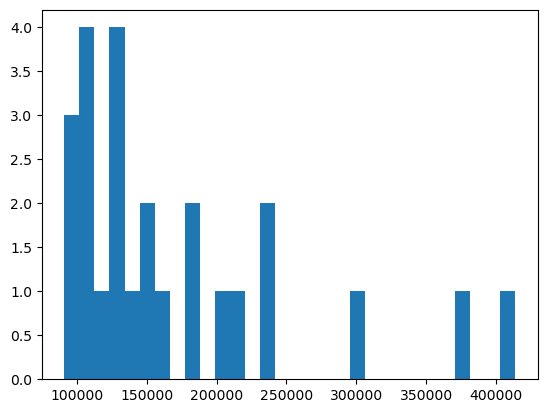

In [375]:
plt.hist(size, bins= 30)
plt.show()

In [376]:
import math

offset = 1.5
for i in range(3):
    for (node1, (x1,y1)) in list(flights_graph.nodes(data="pos")):
        for (node2, (x2,y2)) in list(flights_graph.nodes(data="pos")):
            if(node1 == node2): continue

            dist = math.sqrt(pow(x1-x2,2)+ pow(y1-y2,2))
            size1 = int(node_size_dict.get(node1))
            size2 = int(node_size_dict.get(node2))

            if(dist <= 2 + 0.2 * i):
                a = (y1-y2)/(x1-x2)
                b = y1 - a*x1
                abs_x_dist = (abs(x1-x2)*(dist + offset))/dist - abs(x1-x2)
                (moved,xm,ym), (stay,xs,ys) = ((node1,x1,y1), (node2, x2,y2)) if size1 < size2 else  ((node2, x2,y2), (node1,x1,y1))
                if xs > xm:
                    xm = xs -abs_x_dist
                else:
                    xm = xs  + abs_x_dist
                ym = a * xm + b

                nodes_pos_dict.pop(moved)
                nodes_pos_dict.update({moved : (xm,ym)})


nx.set_node_attributes(flights_graph, nodes_pos_dict, "pos")

In [377]:
nx.relabel_nodes(flights_graph, nodes_labels_dict, copy= False)

In [378]:
weights = np.array([e[2]["Count"] for e in flights_graph.edges(data=True)])
max_weight = np.max(weights)

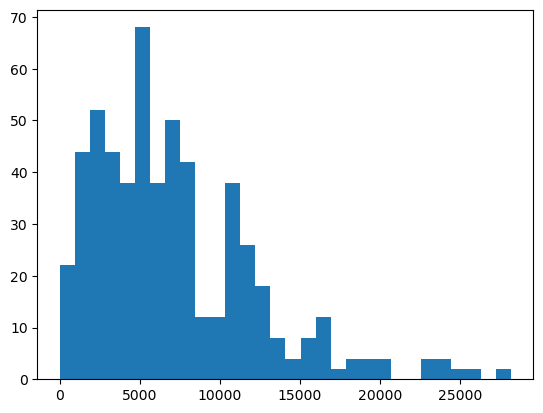

In [379]:
plt.hist(weights, bins = 30)
plt.show()

In [385]:
fig, ax = plt.subplots(1, 1, figsize=(16, 16), dpi = 600)

ax.set_title("25 najczęstszych celów lotów w USA w 2007 roku wraz z połączeniami między nimi", fontsize=20)

nx.draw_networkx_nodes(flights_graph, 
    pos=nx.get_node_attributes(flights_graph,'pos'), 
    node_color="blue", 
    node_size= node_size/4000, 
    ax=ax
)

arc_rad = 0.15
nx.draw_networkx_edges(
    flights_graph,
    pos=nx.get_node_attributes(flights_graph,'pos'),
    width= weights / max_weight * 10,
    edge_color="gray",
    alpha=weights / max_weight,
    ax=ax,
    arrowstyle= "-",
    connectionstyle=f'arc3, rad = {arc_rad}'
)

for i,(node, (x, y)) in enumerate(flights_graph.nodes(data = "pos")):
    ax.text(x, y - 0.2, node, fontsize=7 + np.log(node_size[i]/4000), ha="center", va="center")

for w in [500,1000,2000,5000,10000,20000]:
    ax.plot([], [], "gray", linewidth= w / max_weight * 10, label=w)
ax.legend(title="Liczba lotów pomiędzy lotniskami", frameon=False, bbox_to_anchor=(0, 0.1), loc = "lower left")

ax.text(0.01, 0.1, 
"""
Wybrano 25 lotnisk, które najczęściej występowały jako cel lotu.
Zaznaczono i policzono tylko połączenia pomiędzy nimi.
Nie uwzględniamy kierunku lotu, np. lot z Chicago do Nowego Jorku, będzie uwzględniony na tej smaej krawędzi co lot z Nowego Jorku do Chicago.
Połoenie węzłów miało przybliżać położenie lotnisk w rzeczywistości. 
Niektóre lotniska są przesunięte w celu poprawy czytelności grafu.
""", 
    fontsize=8, 
    transform=ax.transAxes,
    verticalalignment="top" ) # określamy bezwzględne współrzędne tekstu

plt.axis("off")
plt.show()